# Data Analysis 

In this project, "2014-15 Home Sales in King County, WA" dataset is used.

The dataset contains real estate (REs) selling prices between 2014 and 2015 in King Country, Seattle, USA.

It contains 21613 rows with 21 features both interior and location related for REs.

In this work, data is analyzed & cleaned & some fields are transformed.

<table>
  <tr>
   <td><strong>Feature</strong>
   </td>
   <td><strong>Description</strong>
   </td>
  </tr>
  <tr>
   <td><b>id</b>
   </td>
   <td>The id of the RE
   </td>
  </tr>  
  <tr>
   <td><b>date</b>
   </td>
   <td>RE sold Date
   </td>
  </tr>    
  <tr>
      <td><b>price</b>
   </td>
   <td>The price of each home sold
   </td>
  </tr>
  <tr>
   <td><b>bedrooms</b>
   </td>
   <td>Number of bedrooms
   </td>
  </tr>
  <tr>
   <td><b>bathrooms</b>
   </td>
   <td>Number of bathrooms, where .5 accounts for a room with a toilet but no shower
   </td>
  </tr>
  <tr>
   <td><b>sqft_living</b>
   </td>
   <td>Square footage of the apartment interior living space
   </td>
  </tr>
  <tr>
   <td><b>sqft_lot</b>
   </td>
   <td>Square footage of the land space
   </td>
  </tr>
  <tr>
   <td><b>floors</b>
   </td>
   <td>Number of floors
   </td>
  </tr>
  <tr>
   <td><b>waterfront</b>
   </td>
   <td> A dummy variable for whether the apartment was overlooking the waterfront or not. ‘1’ if the property has a waterfront, ‘0’ if not.
   </td>
  </tr>
  <tr>
   <td><b>view</b>
   </td>
   <td>An index from 0 to 4 of how good the view of the property was
   </td>
  </tr>
  <tr>
   <td><b>condition</b>
   </td>
   <td>Condition of the house ranked from 1 to 5
   </td>
  </tr>
  <tr>
   <td><b>grade</b>
   </td>
   <td>Classification by construction quality refers to the types of materials used and the quality of workmanship. Buildings of better quality (higher grade) cost more to build per unit of measure and command a higher value. An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 has a high-quality level of construction and design.
   </td>
  </tr>
  <tr>
   <td><b>sqft_above</b>
   </td>
   <td>The square footage of the interior housing space that is above ground level
   </td>
  </tr>
  <tr>
   <td><b>sqft_basmt</b>
   </td>
   <td>The square footage of the interior housing space that is below ground level
   </td>
  </tr>
  <tr>
   <td><b>yr_built</b>
   </td>
   <td>The year the house was initially built
   </td>
  </tr>
  <tr>
   <td><b>yr_renov</b>
   </td>
   <td>The year of the house’s last renovation. ‘0’ if never renovated
   </td>
  </tr>
  <tr>
   <td><b>zipcode</b>
   </td>
   <td>5 digit zip code
   </td>
  </tr>
  <tr>
   <td><b>lat</b>
   </td>
   <td>Latitude
   </td>
  </tr>
  <tr>
   <td><b>long</b>
   </td>
   <td>Longitude
   </td>
  </tr>
  <tr>
   <td><b>sqft_living15</b>
   </td>
   <td>The average size of interior housing living space for the closest 15 houses, in square feet
   </td>
  </tr>
  <tr>
   <td><b>squft_lot15</b>
   </td>
   <td>The average size of land lots for the closest 15 houses, in square feet
   </td>
  </tr>
</table>

## Import Required Libraries

In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib
import hvplot.pandas
import matplotlib as mpl
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
from matplotlib.patches import Rectangle
import warnings
warnings.filterwarnings('ignore')

In [2]:
sns.set_style("whitegrid")

## Load Datasets

### RE Dataset

In [3]:
df = pd.read_csv('../../data/01_raw/kc_house_data.csv')

In [4]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [5]:
df.info();

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

We do not have any empty values!

### Regions Geojson Dataset

King Country Geojson file which contains zipcode regions is given on the same RE dataset source link.

In [6]:
df_geo_kc = gpd.read_file("../../data/01_raw/King_county_zip.geojson");

In [7]:
df_geo_kc.head()

,OBJECTID,ZIP,COUNTY,ZIP_TYPE,Shape_Leng,Shape_Area,geometry
0,1,98031,33,Standard,117508.231410,2.280129e+08,"MULTIPOLYGON (((-122.21842 47.43750, -122.2193..."
1,2,98032,33,Standard,166737.665152,4.826754e+08,"MULTIPOLYGON (((-122.24187 47.44122, -122.2411..."
2,3,98033,33,Standard,101363.832386,2.566747e+08,"MULTIPOLYGON (((-122.20571 47.65170, -122.2051..."
3,4,98034,33,Standard,98550.460072,2.725072e+08,"MULTIPOLYGON (((-122.17551 47.73706, -122.1755..."
4,5,98030,33,Standard,94351.274949,2.000954e+08,"MULTIPOLYGON (((-122.16746 47.38549, -122.1674..."


In [8]:
print(f"Unique ZIP values: {len(df_geo_kc['ZIP'].unique())}")
print(f"Total King Country geojson shapes: {len(df_geo_kc.index)}")

Unique ZIP values: 85
Total King Country geojson shapes: 85


### GeoDataFrame

I have also created a new column __geometry__ by using the "Point" Geojson object.

It will be used GeoDataFrame creations below. GeoDataframe is used on EDA analysis below. 

In [9]:
# Creating New Dataframe by using Geographic Points from lat & long:
df['geometry'] = list(zip(df.long, df.lat));
df['geometry'] = df['geometry'].apply(Point);

df_geo = gpd.GeoDataFrame(df, geometry='geometry');

## Excluding Irrelevant & Out of Scope Features

We need to exclude some features which are irrelevant. 

And there are some features that we can not expect the end-user to provide.

First let's check the field definitions:

In [10]:
for column in df.columns:
    print(f'{column:<15}: {len(df[column].unique())}\tunique values')

id             : 21436	unique values
date           : 372	unique values
price          : 4028	unique values
bedrooms       : 13	unique values
bathrooms      : 30	unique values
sqft_living    : 1038	unique values
sqft_lot       : 9782	unique values
floors         : 6	unique values
waterfront     : 2	unique values
view           : 5	unique values
condition      : 5	unique values
grade          : 12	unique values
sqft_above     : 946	unique values
sqft_basement  : 306	unique values
yr_built       : 116	unique values
yr_renovated   : 70	unique values
zipcode        : 70	unique values
lat            : 5034	unique values
long           : 752	unique values
sqft_living15  : 777	unique values
sqft_lot15     : 8689	unique values
geometry       : 20832	unique values


The following features will be excluded from the dataset:

* __id__: irrelevant.
* __date__: irrelevant, this value is between 2014 - 2015.
* __squft_liv15__: out of scope.
* __squft_lot15__: out of scope.

__squft_liv15__ and __squft_lot15__ features are out of scope, the end-user could not provide these values. And actually, these values are dependant on the location that we already have (lat, long).

In [11]:
df.drop(columns=['id', 'date', 'sqft_living15', 'sqft_lot15'], inplace=True)
display(df.shape)

(21613, 18)

## Data Imputation

### Renovated Field

We need to convert **yr_renovated** field values because it contains empty values.

Because it contains values with 2 different meanings. The definition of this field is **"The year of the house’s last renovation. ‘0’ if never renovated"**

So we can create 2 new fields __renovated__ & __age_renovated__ by using current __yr_renovated__ and __yr_built__ fıelds
* True or false __renovated__ variable
* For __age_renovated__ field we can convert '0' values as __yr_built__ because we can say that on that date the RE was renovated as well.

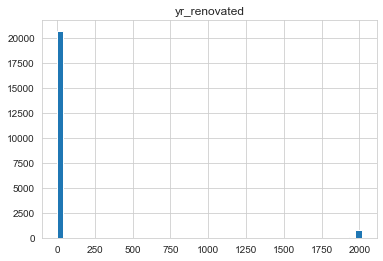

In [12]:
df.hist(column='yr_renovated', bins=50);

In [13]:
df['renovated'] = np.where(df['yr_renovated']==0, 0, 1)
df['yr_renovated'] = np.where(df['yr_renovated']==0, df['yr_built'], df['yr_renovated'])

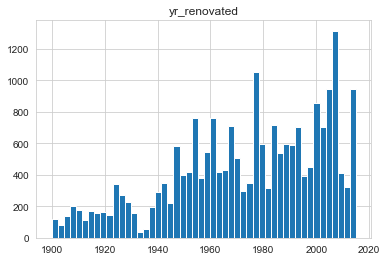

In [14]:
df.hist(column='yr_renovated', bins=50);

I want to transform __yr_built__ value as __age__ of the RE. It will help to understand and compare better.

And then we should also transform __yr_renovated__ to __age_renovated__:

In [15]:
df['age'] = 2015 - df['yr_built']
df['age_renovated'] = 2015 - df['yr_renovated']

df.drop(columns=['yr_built', 'yr_renovated'], inplace=True)

### Basement Field

__sqft_basement__ field also contains 2 meanings. So I think we should introduce a new categorical variable to emphasize a RE has a basement or not by using the __sqft_basement__ field.


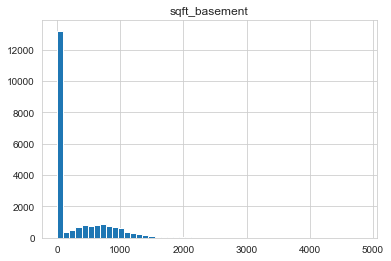

In [16]:
df.hist(column='sqft_basement', bins=50);

In [17]:
df['has_basement'] = np.where(df['sqft_basement']==0, 0, 1)

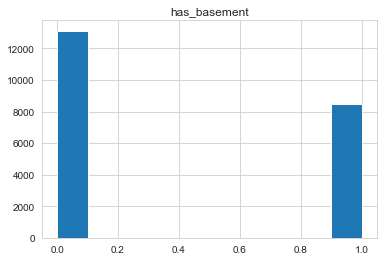

In [18]:
df.hist(column='has_basement');

# Exploratory Data Analysis (EDA)

In [19]:
df.describe().apply(lambda s: s.apply(lambda x: format(x, 'g')))

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,zipcode,lat,long,renovated,age,age_renovated,has_basement
count,21613,21613,21613,21613,21613,21613,21613,21613,21613,21613,21613,21613,21613,21613,21613,21613,21613,21613,21613
mean,540088,3.37084,2.11476,2079.9,15107,1.49431,0.00754176,0.234303,3.40943,7.65687,1788.39,291.509,98077.9,47.5601,-122.214,0.0422894,43.9949,41.614,0.39268
std,367127,0.930062,0.770163,918.441,41420.5,0.539989,0.0865172,0.766318,0.650743,1.17546,828.091,442.575,53.505,0.138564,0.140828,0.201253,29.3734,28.8069,0.488358
min,75000,0,0,290,520,1,0,0,1,1,290,0,98001,47.1559,-122.519,0,0,0,0
25%,321950,3,1.75,1427,5040,1,0,0,3,7,1190,0,98033,47.471,-122.328,0,18,16,0
50%,450000,3,2.25,1910,7618,1.5,0,0,3,7,1560,0,98065,47.5718,-122.23,0,40,38,0
75%,645000,4,2.5,2550,10688,2,0,0,4,8,2210,560,98118,47.678,-122.125,0,64,61,1
max,7.7e+06,33,8,13540,1.65136e+06,3.5,1,4,5,13,9410,4820,98199,47.7776,-121.315,1,115,115,1


When we look at the min, median, max values it seems that we have outliers in almost all features.

Before analyzing pairwise relationships in the dataset, I want to split the features as "real estate" and "location" and analyze them differently.

* __Real estate features__ are construction and directly RE-related features.

* __Location features__ are RE locations related. 

This way will help us to understand correlations better.

In [20]:
real_estate_feature_set = ['price', 'grade', 'sqft_living', 'sqft_above', 'bathrooms', 'view', 'bedrooms', 'floors', 'sqft_basement', 'has_basement', 'waterfront', 'sqft_lot', 'age_renovated', 'renovated', 'age', 'condition']
location_feature_set = ['price', 'zipcode', 'lat', 'long']

## Explanatory Data Anaylisis - Real Estate Features

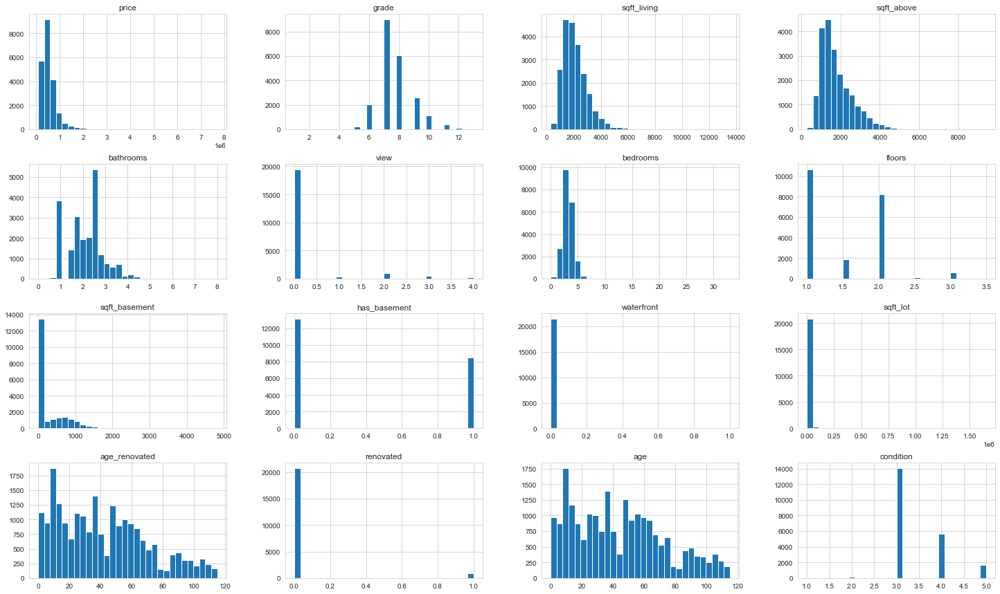

In [21]:
df.hist(column=real_estate_feature_set, bins=30, figsize=(25, 15));

Lets consider all features one by one:
* __price__ : Numerical continues, __skewed to the right__, seems to have outliers
* __grade__: Numerical discrete
* __sqft_living__: Numerical continues, __skewed to the right__, seems to have outliers
* __sqft_above__: Numerical continues, __skewed to the right__, seems to have outliers
* __bathrooms__: Numerical discrete
* __view__: Numerical discrete
* __bedrooms__: Numerical discrete, seems to have outliers
* __floors__: Numerical discrete
* __sqft_basement__: Numerical continues, __skewed to the right__, seems to have outliers
* __has_basement__: Categorical
* __waterfront__: Categorical
* __sqft_lot__: Numerical continues, __skewed to the right__, seems to have outliers
* __age_renovated__: Numerical discrete
* __renovated__: Categorical
* __age__: Numerical discrete
* __condition__: Numerical discrete

### Transformation for Skewed Fields

Since we will try to fit a regression model to this dataset, it is suggested to transform skewed fields.


How much skewed the fields are:


price             4.024069
sqft_living       1.471555
sqft_above        1.446664
sqft_basement     1.577965
sqft_lot         13.060019
dtype: float64

,price,sqft_living,sqft_above,sqft_basement,sqft_lot
0,221900.0,1180,1180,0,5650
1,538000.0,2570,2170,400,7242


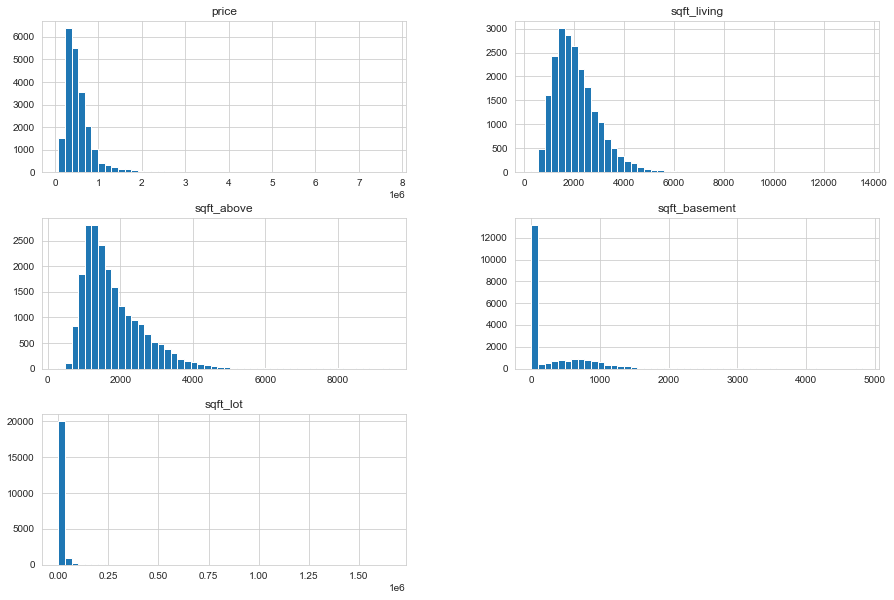

In [22]:
skewed_colls = ['price', 'sqft_living', 'sqft_above', 'sqft_basement', 'sqft_lot']

print("How much skewed the fields are:")
display(df[skewed_colls].skew())
df[skewed_colls].hist(bins=50, figsize=(15, 10))
df[skewed_colls].head(2)

it is known about the skewness that:

* If the skewness is between -0.5 and 0.5, the data are fairly symmetrical
* If the skewness is between -1 and — 0.5 or between 0.5 and 1, the data are moderately skewed
* If the skewness is less than -1 or greater than 1, the data are highly skewed

So as we see, we need to transform these values before moving on to the Correlation matrix. 

There is couple of transformation ways on dealing with skewed data:
* Square root
* Log
* Box-Cox

I will apply log transformation.

In [23]:
df[skewed_colls] = np.log1p(df[skewed_colls])

Lets look at the results again:

In [24]:
display(df[skewed_colls].head(2))
display(df[skewed_colls].skew())

,price,sqft_living,sqft_above,sqft_basement,sqft_lot
0,12.309987,7.074117,7.074117,0.000000,8.639588
1,13.195616,7.852050,7.682943,5.993961,8.887791


price            0.428077
sqft_living     -0.034727
sqft_above       0.254034
sqft_basement    0.484603
sqft_lot         0.962893
dtype: float64

The skewness values are better now.

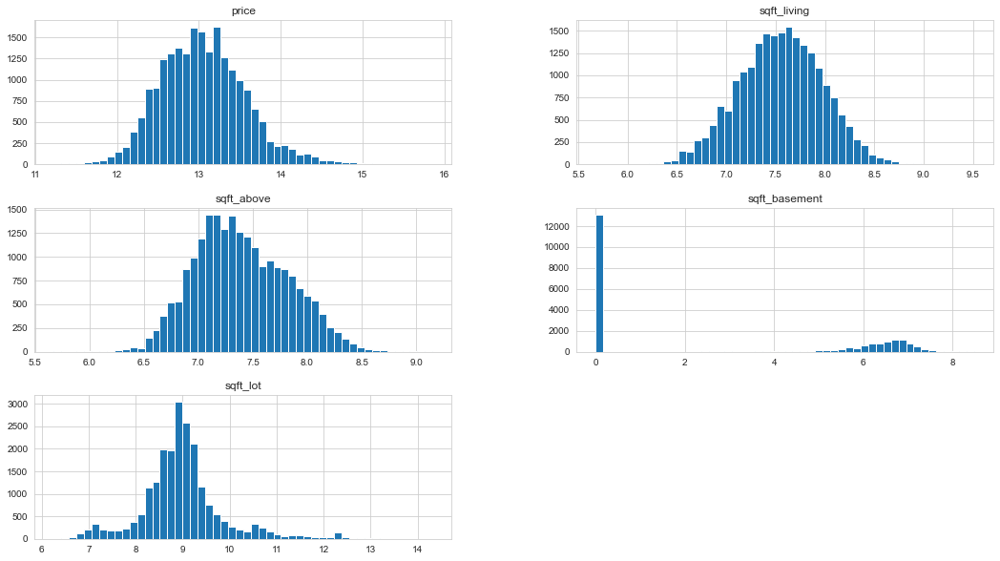

In [25]:
df.hist(column=skewed_colls, bins=50, figsize=(18, 10));

### Pearson Correlation Matrix

We want to see:
* The correlation between fields
* The correlation between Price that we want to build a model to predict it

I have sorted the fields to see the correlation better.

In [26]:
def plot_correlation(df, title, fig_size=17):
    plt.figure(figsize=(fig_size, fig_size))
    plt.title(title, fontsize=20)
    res = sns.heatmap(df.corr(), linewidths=0.1, square=True, cmap='RdYlGn',
                annot=True, annot_kws={"size": 14}, cbar_kws={"shrink": .82});

    res.set_xticklabels(res.get_xmajorticklabels(), fontsize = 18);
    res.set_yticklabels(res.get_ymajorticklabels(), fontsize = 18);

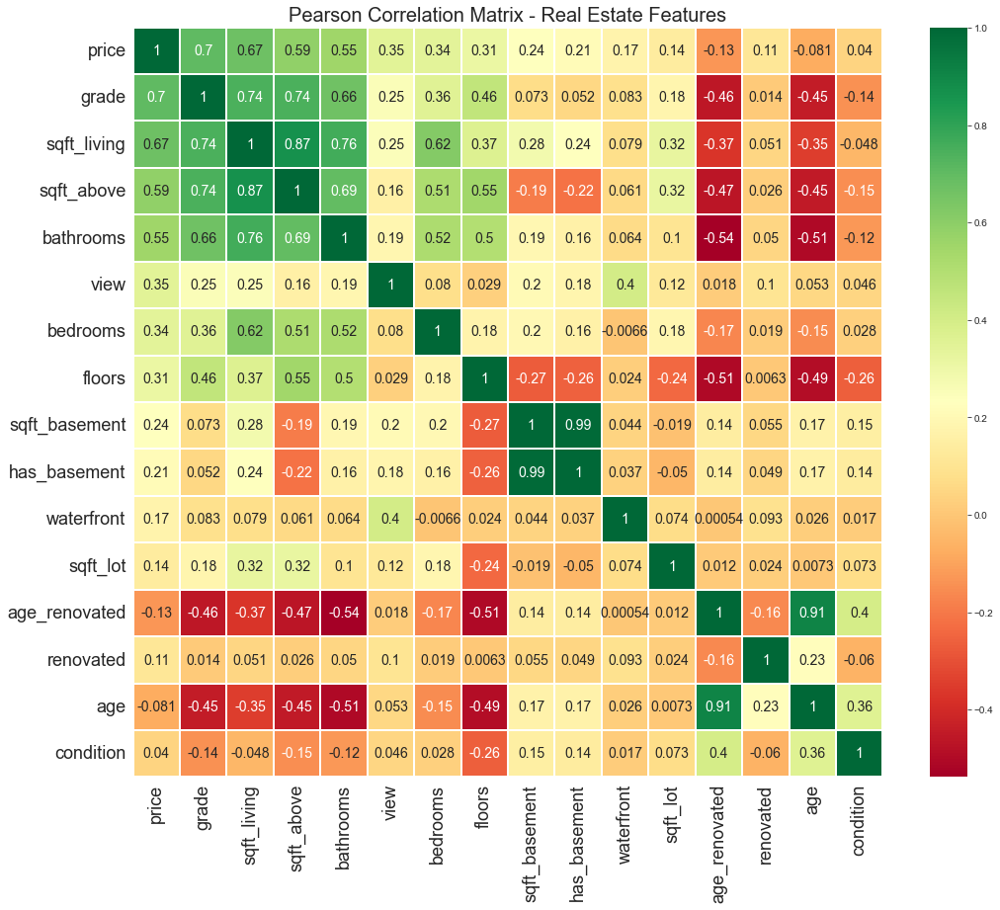

In [27]:
plot_correlation(df[real_estate_feature_set], 'Pearson Correlation Matrix - Real Estate Features', 17);

### Outliers

Let's analyze each field by considering correlations and clear outliers. 

On outlier detection and treatment I will use Using 1.5 IQR (Inter Quartile Range) rule. It is:

* Calculate the first quartile, Q1.
* Calculate the third quartile, Q3.
* Calculate the IQR = Q3 - Q1.
* Define the excepted range as [Q1 - 1.5 * IQR, Q3 + 1.5 * IQR]
* Any data point outside this range is considered an outlier and should be removed.


The following functions will be used EDA of each field.

In [28]:
def get_iqr_based_range(df, col):
    q25, q75 = np.percentile(df[col], [25, 75])
    iqr = q75 - q25
    return q25 - iqr * 1.5, q75 + iqr * 1.5

def get_iqr_based_outliers(df, col):
    lower, upper = get_iqr_based_range(df, col)
    return df[(df[col] < lower) | (df[col] > upper)]

def exclude_iqr_based_outliers(df, col):
    df.drop(get_iqr_based_outliers(df, col).index, inplace=True)
    
def head_with_real_values(df, skewed_colls, count):
    df_copied = df.copy()
    for col in skewed_colls:
        if col in df_copied.columns:
            df_copied[col] = np.expm1(df_copied[col])
    display(df_copied.head(count))
    
def display_exponential_y_labels(ax):
    ax.set_yticks(ax.get_yticks().tolist())
    ax.set_yticklabels([round(np.expm1(y)/10)*10 for y in ax.get_yticks().tolist()])    
    
def display_exponential_x_labels(ax):
    ax.set_xticks(ax.get_xticks().tolist())
    ax.set_xticklabels([round(np.expm1(x)/10)*10 for x in ax.get_xticks().tolist()])      
    
def display_exponential_labels(ax):
    display_exponential_y_labels(ax)
    display_exponential_x_labels(ax)
    
def get_geodataframe(df):
    return gpd.GeoDataFrame(df, geometry='geometry');

def plot_eda_graphs_for_feature(feature, df, figsize=(20,14), show_legend_on_map=True):
    _, ax = plt.subplots(2, 2, figsize=figsize);
    
    sns.scatterplot(data=df.sort_values(by=[feature]), s=20, x="sqft_living", y="price", hue=feature, palette='cool', ax=ax[0, 0]);
    display_exponential_labels(ax[0, 0]);

    sns.boxplot(x=df[feature], y=df['price'], palette='cool', ax=ax[0, 1]);

    df_geo = get_geodataframe(df);                     
    df_geo_kc.plot(ax=ax[1, 0], color='lightgray', edgecolor='gray', zorder=1);
    df_geo.sort_values(by=[feature]).plot(ax=ax[1, 0], markersize=4, cmap="cool", marker="o", zorder=2, column=feature, legend=show_legend_on_map, categorical=True);
    df_geo_kc.plot(ax=ax[1, 0], facecolor="none", edgecolor='gray', zorder=3);

    sns.violinplot(x=df[feature], ax=ax[1, 1]);    

#### 1) RE Size Related Features

These are: 
* __sqft_living__ 
* __sqft_above__
* __sqft_basement__
* __has_basement__
* __sqft_lot__

I have realized that basement size is mostly proportional to RE living size. So I think __sqft_living__ & __has_basement__ fields will be enough to cover required info.

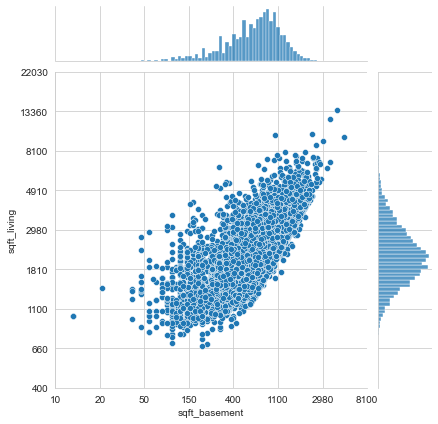

In [29]:
g = sns.jointplot(data=df[df['has_basement']==1], x="sqft_basement", y="sqft_living");
display_exponential_labels(g.ax_joint)

In [30]:
df.drop(columns=['sqft_above', 'sqft_basement'], inplace=True)

Lets check the outliers

[(5.5, 9.8)]

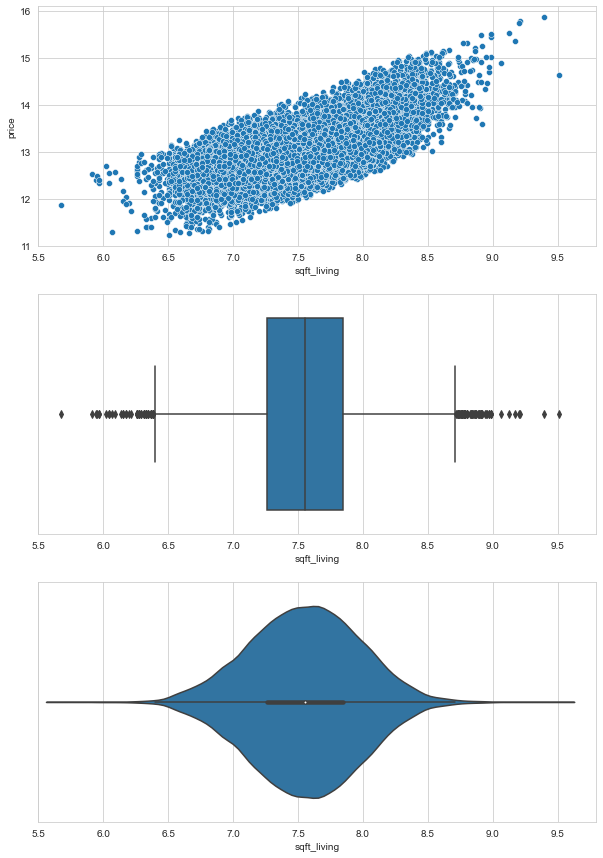

In [31]:
_, ax = plt.subplots(3, 1, figsize=(10,15));
sns.scatterplot(data=df, x="sqft_living", y="price", ax=ax[0]);
sns.boxplot(x=df["sqft_living"], whis=1.5, ax=ax[1]);
sns.violinplot(x=df['sqft_living'], ax=ax[2]);
x_range = (5.5, 9.8);
ax[0].set(xlim=x_range)
ax[1].set(xlim=x_range)
ax[2].set(xlim=x_range)

In [32]:
lower, upper = get_iqr_based_range(df, 'sqft_living')
print(f"IQR based outlier sqft_living limits: [{lower}, {upper}]")
print(f"IQR based outlier sqft_living limits real values: [{round(np.expm1(lower))}, {round(np.expm1(upper))}]")

IQR based outlier sqft_living limits: [6.393714280036107, 8.714556581005233]
IQR based outlier sqft_living limits real values: [597, 6090]


In [33]:
outliers = get_iqr_based_outliers(df, 'sqft_living')
print(f"Over than upper limit: {len(df[df['sqft_living'] > upper].index)}")
print(f"Under than lower limit: {len(df[df['sqft_living'] < lower].index)}")
print(f"Outlier total percentage: {len(outliers.index) / len(df.index) * 100} %")

Over than upper limit: 60
Under than lower limit: 50
Outlier total percentage: 0.5089529449868134 %


I don't want to set that much data as outliers because after log transformation the values seem not to be outliers anymore.

I will set the truncated range wider [6, 9]:

In [34]:
lower, upper = (6, 9)
outliers = df[(df['sqft_living'] < lower) | (df['sqft_living'] > upper)];

print(f"Count of over than upper limit: {len(df[df['sqft_living'] > upper].index)}")
print(f"Count of under than lower limit: {len(df[df['sqft_living'] < lower].index)}")
print(f"Outlier total percentage: {len(outliers.index) / len(df.index) * 100} %")

Count of over than upper limit: 7
Count of under than lower limit: 6
Outlier total percentage: 0.0601489844075325 %


Let's list the some REs outliers with real values to make sure

In [35]:
head_with_real_values(outliers, skewed_colls, 5)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,zipcode,lat,long,geometry,renovated,age,age_renovated,has_basement
860,245000.0,1,0.75,380.0,15000.0,1.0,0,0,3,5,98168,47.4810,-122.323,POINT (-122.32300 47.48100),0,52,52,0
3914,7062500.0,5,4.50,10040.0,37325.0,2.0,1,2,3,11,98004,47.6500,-122.214,POINT (-122.21400 47.65000),1,75,14,1
4411,5570000.0,5,5.75,9200.0,35069.0,2.0,0,0,3,13,98039,47.6289,-122.233,POINT (-122.23300 47.62890),0,14,14,1
4868,228000.0,0,1.00,390.0,5900.0,1.0,0,0,2,4,98118,47.5260,-122.261,POINT (-122.26100 47.52600),0,62,62,0
7252,7700000.0,6,8.00,12050.0,27600.0,2.5,0,3,4,13,98102,47.6298,-122.323,POINT (-122.32300 47.62980),1,105,28,1


We have a couple of ways of dealing with outliers: 
* Excluding from dataset
* Capping with lower and upper boundaries

Since sqft_living has a huge correlation with the price I don't want to cap sqft_living values. So I will exclude these items from the dataset.

In [36]:
df.drop(outliers.index, inplace=True)

And as we see prices of REs are higher if it contains the basement as we expected.

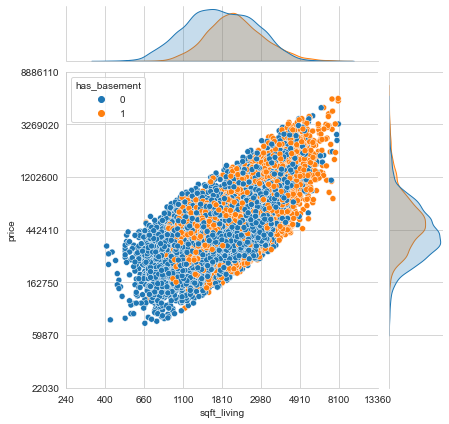

In [37]:
g = sns.jointplot(data=df, x="sqft_living", y="price", hue="has_basement");
display_exponential_labels(g.ax_joint)

__sqft_lot__ field:

It is very strange that there is no direct correlation between sqft_lot and price fields.

Please look at the data points greater than 13 in this logarithmic scale:

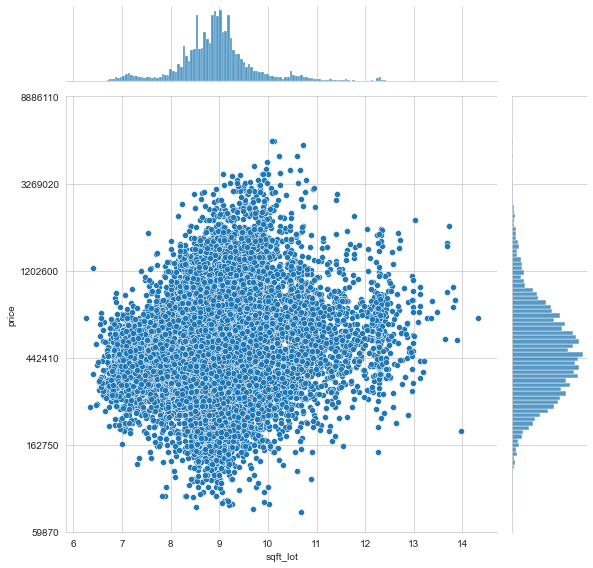

In [38]:
g = sns.jointplot(data=df, x="sqft_lot", y="price", height=8);
display_exponential_y_labels(g.ax_joint)

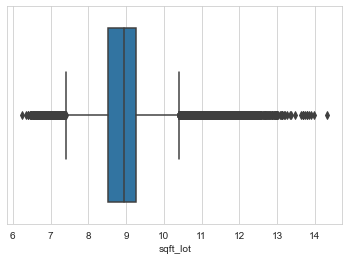

In [39]:
sns.boxplot(x=df['sqft_lot']);

#### 2) RE age & renovation related fields

* __age__
* __age_renovated__
* __renovated__

I will exclude __age__ field because it is covered under __age_renovated__ and it has less correlation with __price__.

In [40]:
df.drop(columns=['age'], inplace=True)

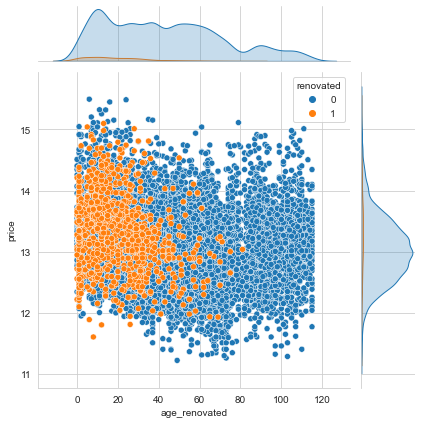

In [41]:
sns.jointplot(data=df.sort_values(by=['renovated']), x="age_renovated", y="price", hue="renovated");

We do not have outliers for __age_renovated__ and __renovated__ fields.

#### 3) __bathrooms__

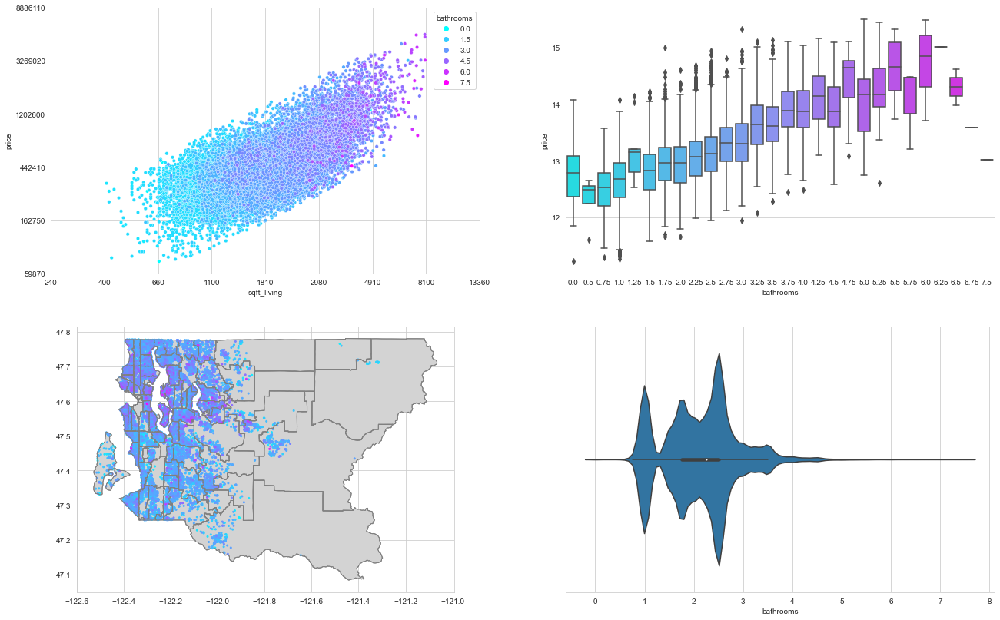

In [42]:
plot_eda_graphs_for_feature('bathrooms', df, figsize=(22,14), show_legend_on_map=False)

As we see we have a lack of data for __bathrooms__ > 4.5. And in price vs bathrooms boxplots after 4.5 we can not observe a bathroom count effect on the price much.

So I think we can cap the bathroom counts to 4.5 for greater values, and 0.5 for lower, because of lack of data and having less correlation between prices:

In [43]:
lower, upper = get_iqr_based_range(df, 'bathrooms')
print(f"IQR lower, upper: {lower}, {upper}")

lower, upper = (0.5, 4.5)
print(f"Outlier count bigger than upper limit: {len(df[df['bathrooms'] > upper].index)}")
print(f"Outlier count less than lower limit: {len(df[df['bathrooms'] < lower].index)}")
print(f"Outlier total percentage: {len(df[(df['bathrooms'] > upper) | (df['bathrooms'] < lower)].index) / len(df.index) * 100} %")

IQR lower, upper: 0.625, 3.625
Outlier count bigger than upper limit: 81
Outlier count less than lower limit: 9
Outlier total percentage: 0.4166666666666667 %


In [44]:
df['bathrooms'].clip(lower=lower, upper=upper, inplace=True)

#### 4) __bedrooms__

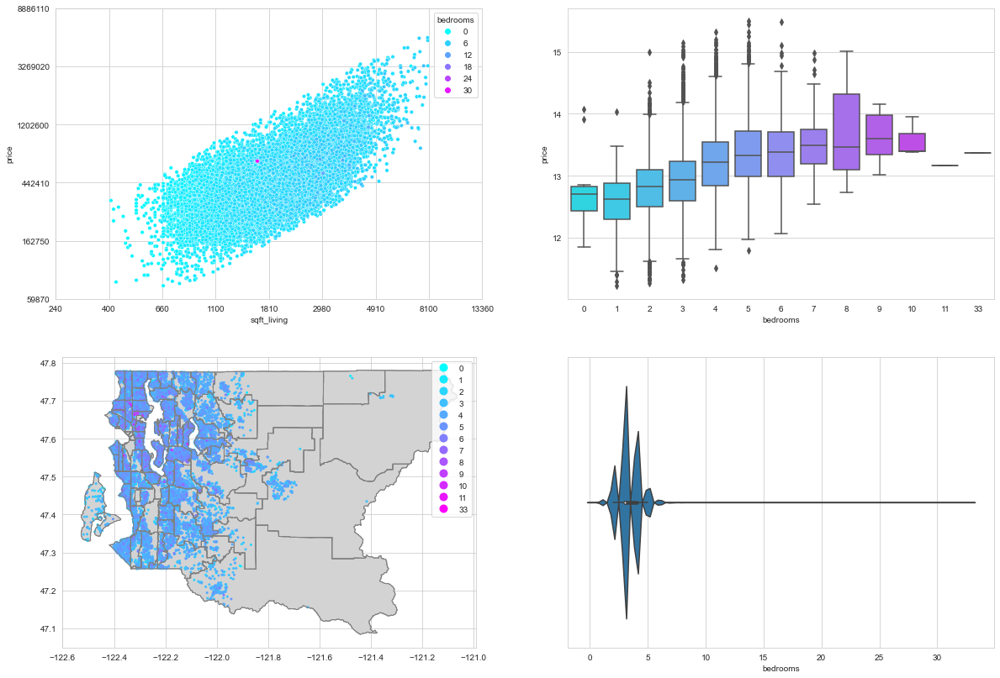

In [45]:
plot_eda_graphs_for_feature('bedrooms', df)

Our outliers are pretty clear here. Most probably 33 bedroom value was entered wrongly. Actually, it is better to drop wrongly entered data.

In [46]:
head_with_real_values(df[df['bedrooms'] == 33], skewed_colls, 5)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,zipcode,lat,long,geometry,renovated,age_renovated,has_basement
15870,640000.0,33,1.75,1620.0,6000.0,1.0,0,0,5,7,98103,47.6878,-122.331,POINT (-122.33100 47.68780),0,68,1


In [47]:
df['bedrooms'].value_counts().sort_index()

0       10
1      196
2     2760
3     9824
4     6882
5     1597
6      270
7       37
8       13
9        6
10       3
11       1
33       1
Name: bedrooms, dtype: int64

Since at the end I will write a transform function, the following code seems to be more convenient to drop definite outliers:

In [48]:
df.drop(df[df['bedrooms'] > 15].index, inplace=True)

Lets check the IQR values:

In [49]:
lower, upper = get_iqr_based_range(df, 'bedrooms')
print(f"IQR lower, upper: {lower}, {upper}")

outliers = get_iqr_based_outliers(df, 'bedrooms')
print(f"Outlier count bigger than upper limit: {len(df[df['bedrooms'] > upper].index)}")
print(f"Outlier count less than lower limit: {len(df[df['bedrooms'] < lower].index)}")
print(f"Outlier total percentage: {len(outliers.index) / len(df.index) * 100} %")

IQR lower, upper: 1.5, 5.5
Outlier count bigger than upper limit: 330
Outlier count less than lower limit: 206
Outlier total percentage: 2.481596370202324 %


Since 0 bedroom apartments have a different meaning (studio apartments) their price calculation might be different. 

I will cap upper limit as 7 because of having lack of data and not having well price correlations.

In [50]:
df['bedrooms'].clip(upper=7, inplace=True)

After cleaning the data we can see observe the distribution better:

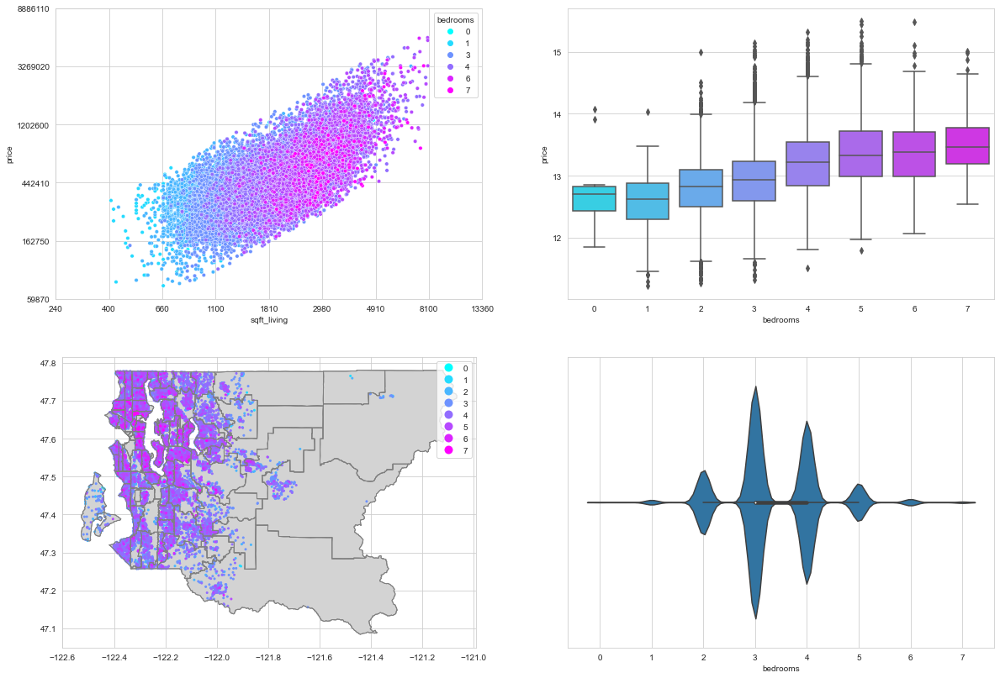

In [51]:
plot_eda_graphs_for_feature('bedrooms', df)

#### 5) __floors__

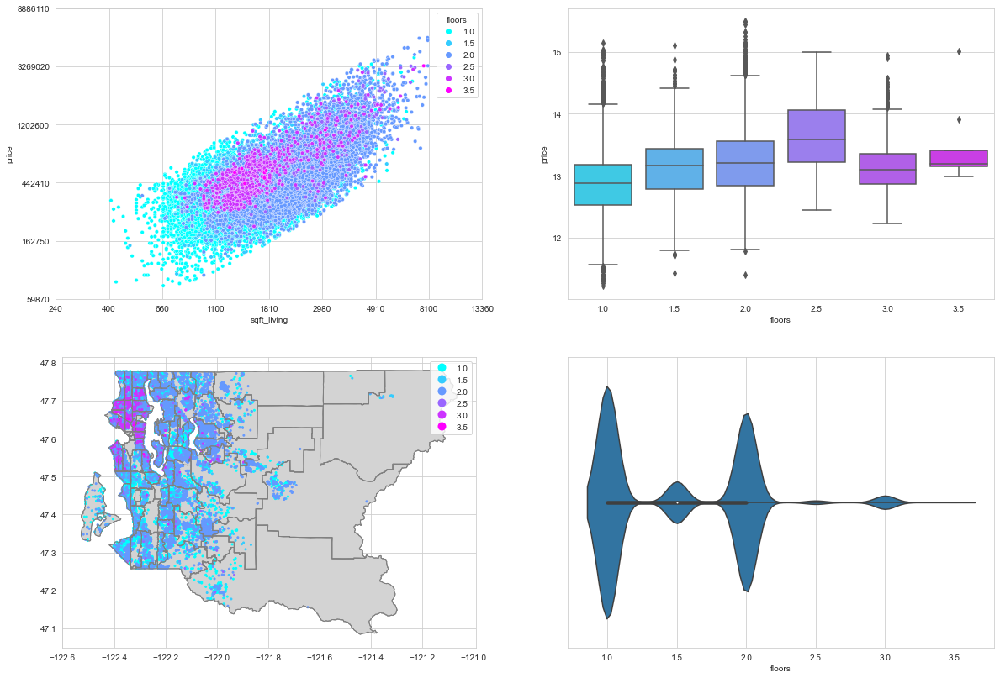

In [52]:
plot_eda_graphs_for_feature('floors', df)

Let's check the IQR values:

In [53]:
lower, upper = get_iqr_based_range(df, 'floors')
print(f"IQR lower, upper: {lower}, {upper}")

print(f"RE count for 3.5 floors: {len(df[df['floors'] == 3.5].index)}")
print(f"RE count for 3 floors: {len(df[df['floors'] == 3].index)}")

IQR lower, upper: -0.5, 3.5
RE count for 3.5 floors: 8
RE count for 3 floors: 612


Since we have fewer data and not an observable correlation with price for 3.5 floors apartments, I am capping floors to 3 upper limit.

In [54]:
df['floors'].clip(upper=3, inplace=True)

#### 6) __grade__

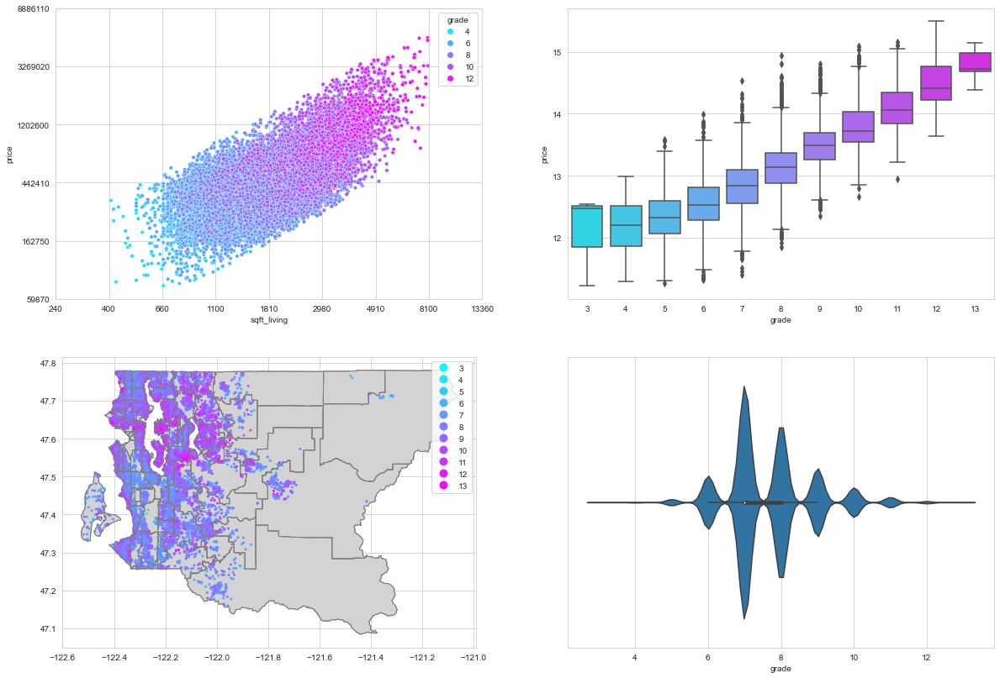

In [55]:
plot_eda_graphs_for_feature('grade', df)

I think we do not have outliers for grade field.

#### 7) __view__

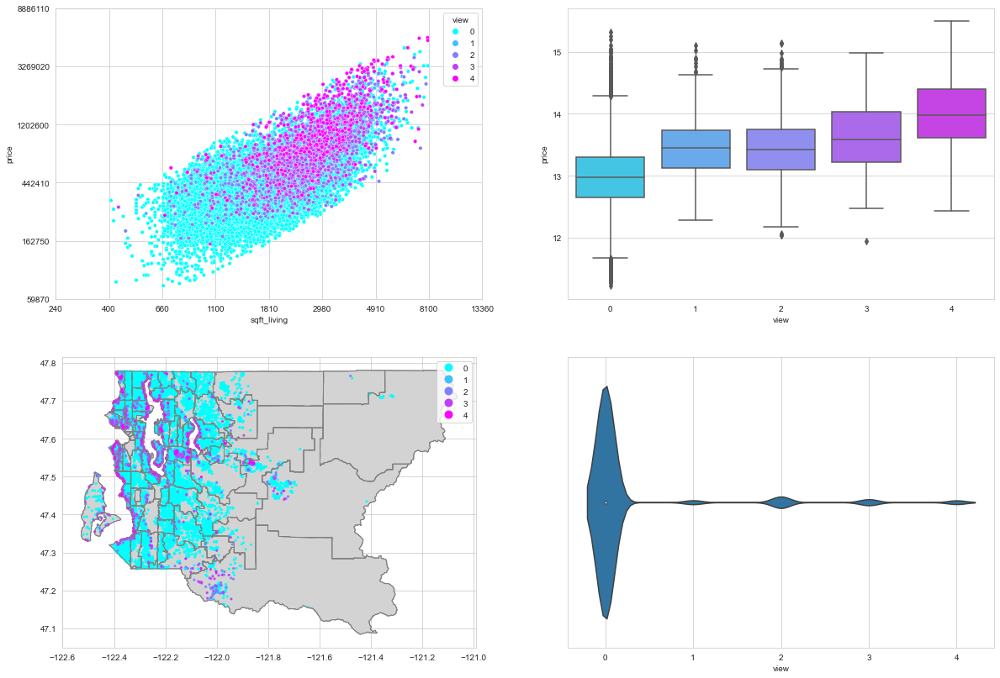

In [56]:
plot_eda_graphs_for_feature('view', df)

__view__ field is defined as: "An index from 0 to 4 of how good the view of the property was". 

I am not expecting 90% REs has a bad looking.

But it seems to be __view__ field was partially collected because there are many 0 values and we are not sure which ones are 0 score and which ones are not collected. It is too imbalanced, I don't think that many REs have a bad looking.

We may:
* Drop __view__ feature at all. 
* We may set all 0 values as the mean of view value

I have decided to drop this field because it may have a bad side effect on the model.

__TODO__: create a variant of this dataset that contains this feature and compare the model scores with the same training set.

In [57]:
df.drop(columns=['view'], inplace=True)

#### 8) __waterfront__

waterfront feature is defined as: "A dummy variable for whether the apartment was overlooking the waterfront or not. ‘1’ if the property has a waterfront, ‘0’ if not."

I want to highlight __waterfront=True__ REs on the map to analyze this feature better.

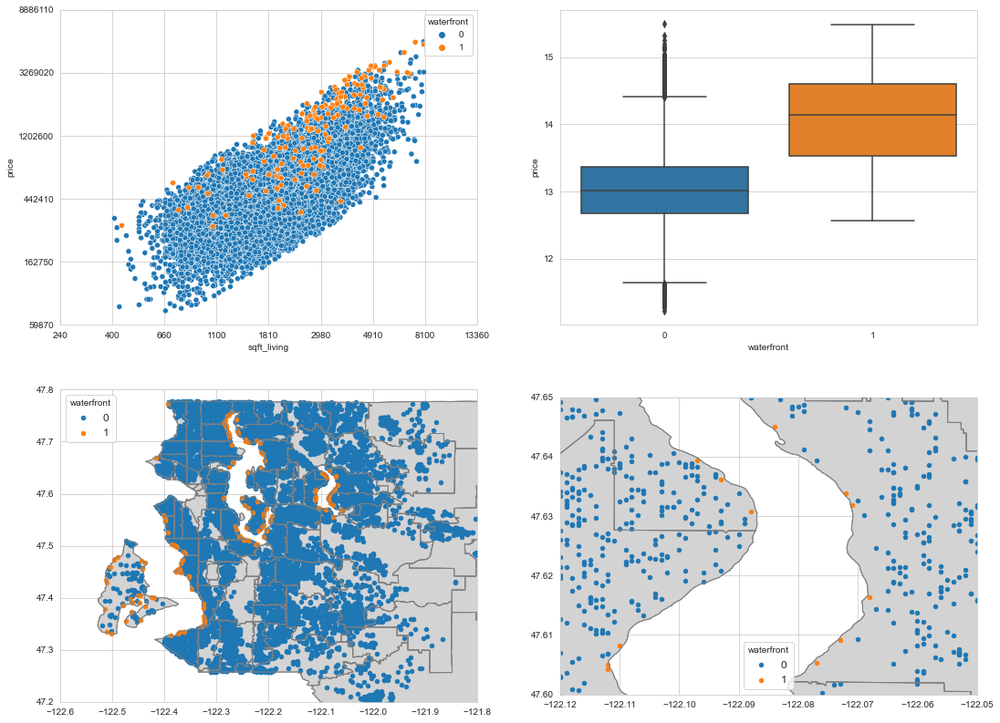

In [58]:
_, ax = plt.subplots(2, 2, figsize=(18, 14));
sns.scatterplot(data=df.sort_values(by=['waterfront']), x="sqft_living", y="price", hue="waterfront", ax=ax[0, 0]);
display_exponential_labels(ax[0, 0]);

sns.boxplot(x=df['waterfront'], y=df['price'], ax=ax[0, 1]);

# Plot Goegraphic data
# 1. layer gray lands, 2. & 3. layers REs, 4. layer only grey borders.
df_geo_kc.plot(ax=ax[1, 0], color='lightgray', edgecolor='gray', zorder=1);
df_geo[df_geo['waterfront'] == 0].plot(ax=ax[1, 0], markersize=20, color='#1F77B4', marker="o", zorder=2, label='0');
df_geo[df_geo['waterfront'] == 1].plot(ax=ax[1, 0], markersize=20, color='#FF7F0E', marker="o", zorder=3, label='1');
df_geo_kc.plot(ax=ax[1, 0], facecolor="none", edgecolor='gray', zorder=4);
ax[1, 0].set(xlim=(-122.6, -121.8), ylim=(47.2, 47.8));
ax[1, 0].set_aspect('equal');
ax[1, 0].legend(title="waterfront", prop={'size': 12});


# All water densed areas
df_geo_kc.plot(ax=ax[1, 1], color='lightgray', edgecolor='gray', zorder=1);
df_geo[df_geo['waterfront'] == 0].plot(ax=ax[1, 1], markersize=20, color='#1F77B4', marker="o", zorder=2, label='0');
df_geo[df_geo['waterfront'] == 1].plot(ax=ax[1, 1], markersize=20, color='#FF7F0E', marker="o", zorder=3, label='1');
df_geo_kc.plot(ax=ax[1, 1], facecolor="none", edgecolor='gray', zorder=4);
ax[1, 1].set(xlim=(-122.12, -122.05), ylim=(47.6, 47.65));
ax[1, 1].set_aspect('equal');
ax[1, 1].legend(title="waterfront", prop={'size': 12});

Ok, all waterfront True REs seems to be located near to the water.

But it seems that the waterfront may not be set properly (please look at figure 4 above). There are some REs very close to the water but not set as the waterfront.

But I will keep this categorical value.

#### 9) __condition__

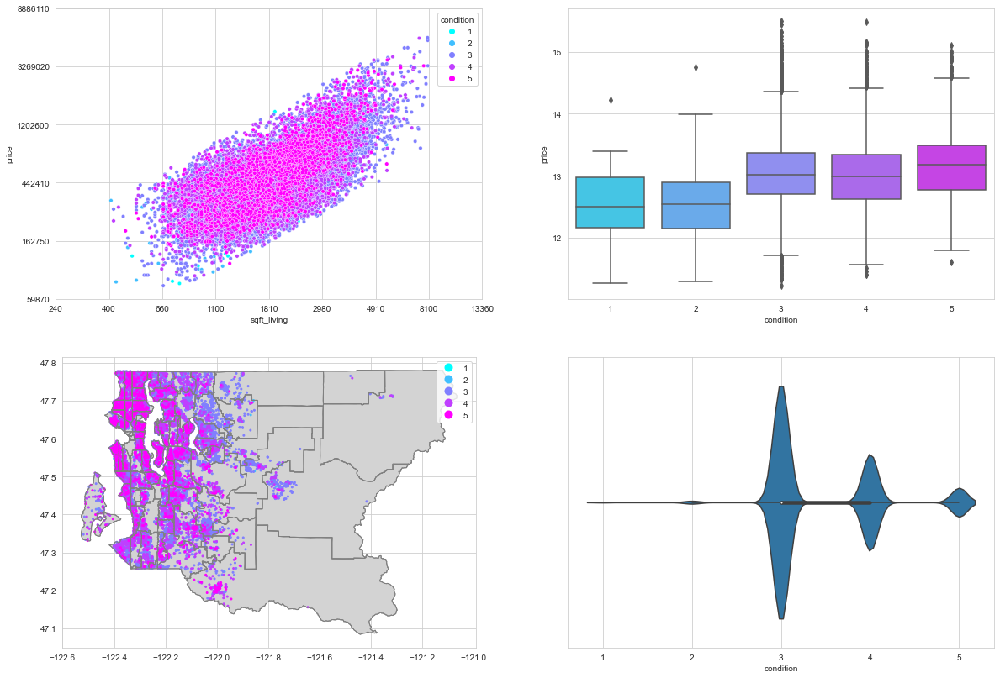

In [59]:
plot_eda_graphs_for_feature('condition', df)

We have again an imbalanced quantitative discrete feature. We have very few 1 and 2 value samples. But it has a pretty good correlation between price.

We do not have outliers.

#### 10) Price

I wanted to analyze Price value lastly because I wanted to clear all other outliers first.

Let's check the outliers and analyze some of these in detail.

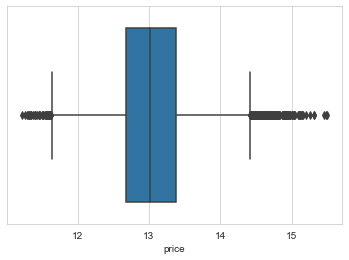

In [60]:
sns.boxplot(x=df["price"], whis=1.5);

The list of top 5 and bottom 5 REs in terms of price values:

In [61]:
head_with_real_values(df.sort_values(by='price', ascending=False), skewed_colls, 5)
head_with_real_values(df.sort_values(by='price'), skewed_colls, 5)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,zipcode,lat,long,geometry,renovated,age_renovated,has_basement
1448,5350000.0,5,4.5,8000.0,23985.0,2.0,0,3,12,98004,47.6232,-122.220,POINT (-122.22000 47.62320),0,6,1
1315,5300000.0,6,4.5,7390.0,24829.0,2.0,1,4,12,98040,47.5631,-122.210,POINT (-122.21000 47.56310),0,24,1
1164,5110800.0,5,4.5,8010.0,45517.0,2.0,1,3,12,98033,47.6767,-122.211,POINT (-122.21100 47.67670),0,16,1
2626,4500000.0,5,4.5,6640.0,40014.0,2.0,1,3,12,98155,47.7493,-122.280,POINT (-122.28000 47.74930),0,11,1
8638,4489000.0,4,3.0,6430.0,27517.0,2.0,0,3,12,98004,47.6208,-122.219,POINT (-122.21900 47.62080),0,14,0


,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,zipcode,lat,long,geometry,renovated,age_renovated,has_basement
1149,75000.0,1,0.50,670.0,43377.0,1.0,0,3,3,98022,47.2638,-121.906,POINT (-121.90600 47.26380),0,49,0
15293,78000.0,2,1.00,780.0,16344.0,1.0,0,1,5,98168,47.4739,-122.280,POINT (-122.28000 47.47390),0,73,0
465,80000.0,1,0.75,430.0,5050.0,1.0,0,2,4,98014,47.6499,-121.909,POINT (-121.90900 47.64990),0,103,0
16198,81000.0,2,1.00,730.0,9975.0,1.0,0,1,5,98168,47.4808,-122.315,POINT (-122.31500 47.48080),0,72,0
8274,82000.0,3,1.00,860.0,10426.0,1.0,0,3,6,98146,47.4987,-122.341,POINT (-122.34100 47.49870),0,61,0


They are not seem to be outliers, I will keep as is.

## Explanatory Data Anaylisis - Location Features

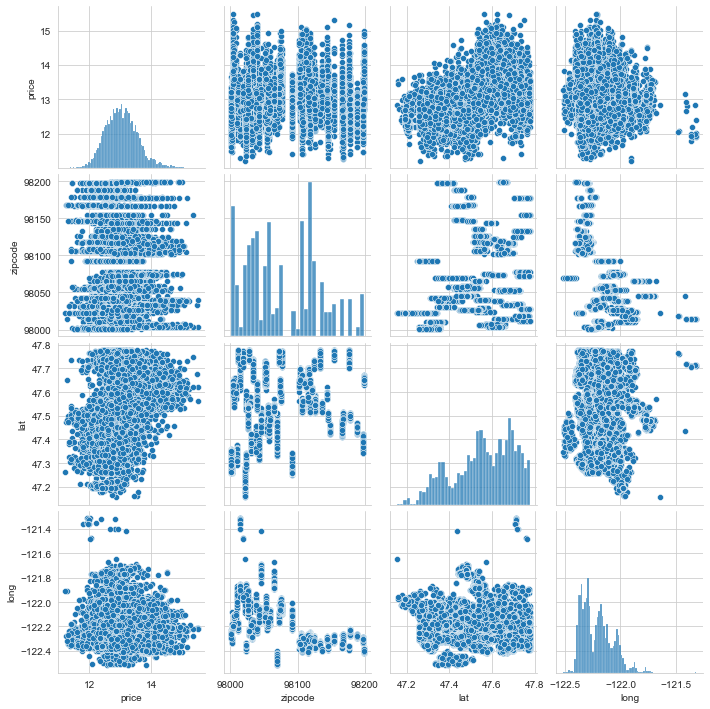

In [62]:
sns.pairplot(df[location_feature_set]);

It seems that we have some outliers in terms of location (please check the long vs lat plot above).

### Pearson Correlation Matrix

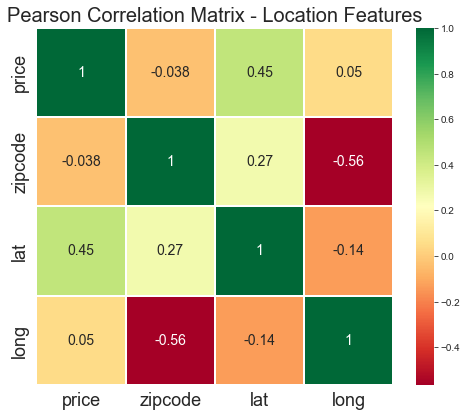

In [63]:
plot_correlation(df[location_feature_set], 'Pearson Correlation Matrix - Location Features', 8);

Let's analyze why __lat__ has more correlation with __price__ rather than __long__.

Since zipcode is a categorical feature, correlation values are meaningless. But we can say that zipcodes may decrease when you move from west to east (-0.56 correlation).

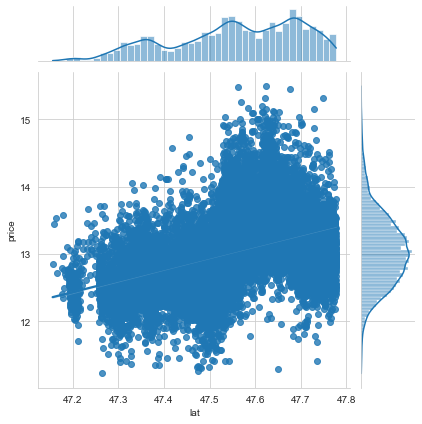

In [64]:
sns.jointplot(x="lat", y="price", data=df[location_feature_set], kind="reg");

As we see we have more samples on the north. And We observe that the prices increase as we go north.

That is why we have more correlation between __lat__ and __price__

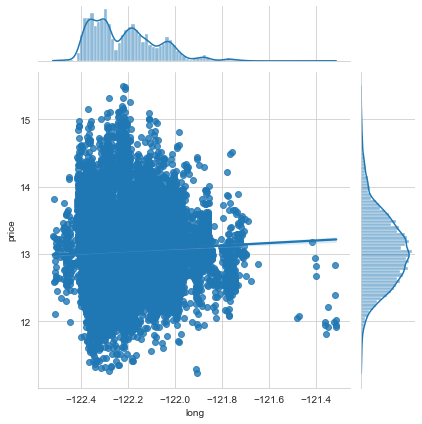

In [65]:
sns.jointplot(x="long", y="price", data=df[location_feature_set], kind="reg");

We observe that we have more samples on the west.

### Outliers

#### 1) __zipcode__

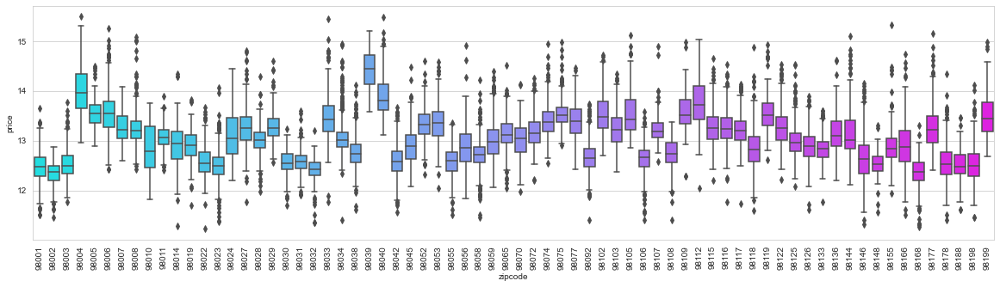

In [66]:
plt.figure(figsize = (20, 5));
ax = sns.boxplot(x=df['zipcode'], y=df['price'], palette='cool');
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

As we see on the box plots, zipcodes may contain valuable information for the price. We need to keep it.

In terms of outliers, we should consider having enough data on the region. Let's analyze together with lat & long values below.

#### 2) __lat__ & __long__

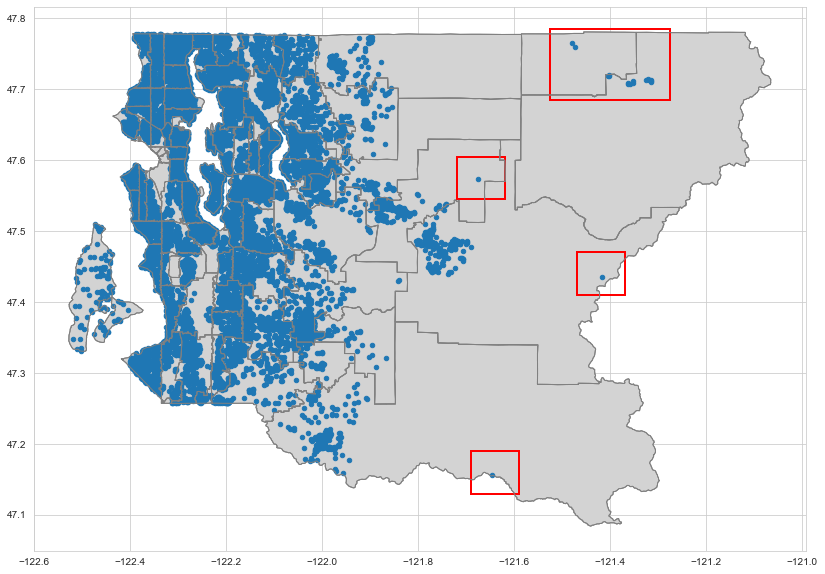

In [67]:
plt.figure(figsize = (14, 10));
ax = plt.gca();
df_geo_kc.plot(ax=ax, color='lightgray', edgecolor='gray', zorder=1);
df_geo.plot(ax=ax, markersize=20, marker="o", zorder=2);
df_geo_kc.plot(ax=ax, facecolor="none", edgecolor='gray', zorder=3);

# Outliers
def highligh_outliers(ax):
    ax.add_patch(Rectangle(xy=(-121.525, 47.685), width=0.25, height=0.1, edgecolor='r', fc='None', lw=2));
    ax.add_patch(Rectangle(xy=(-121.47, 47.41), width=0.1, height=0.06, edgecolor='r', fc='None', lw=2));
    ax.add_patch(Rectangle(xy=(-121.72, 47.545), width=0.1, height=0.06, edgecolor='r', fc='None', lw=2));
    ax.add_patch(Rectangle(xy=(-121.69, 47.13), width=0.1, height=0.06, edgecolor='r', fc='None', lw=2));
    
highligh_outliers(ax);

I think red circled areas can be set as outliers. 

Since RE price values should be dependant on the location, we need to have enough data in the areas (clusters).

In [68]:
outliers1 = (df['long'] > -121.525) & (df['long'] < -121.525 + 0.25) & (df['lat'] > 47.685) & (df['lat'] < 47.685 + 0.1);
outliers2 = (df['long'] > -121.47) & (df['long'] < -121.47 + 0.1) & (df['lat'] > 47.41) & (df['lat'] < 47.41 + 0.06);
outliers3 = (df['long'] > -121.72) & (df['long'] < -121.72 + 0.1) & (df['lat'] > 47.545) & (df['lat'] < 47.545 + 0.06);
outliers4 = (df['long'] > -121.69) & (df['long'] < -121.69 + 0.1) & (df['lat'] > 47.13) & (df['lat'] < 47.13 + 0.06);

outliers = df[outliers1 | outliers2 | outliers3 | outliers4];

head_with_real_values(outliers, skewed_colls, 5);
print(f"Count of location based outliers: {len(outliers.index)}")

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,zipcode,lat,long,geometry,renovated,age_renovated,has_basement
2589,134000.0,2,1.50,980.0,5000.0,2.0,0,3,7,98014,47.7076,-121.359,POINT (-121.35900 47.70760),1,12,0
2927,167000.0,1,1.00,780.0,10235.0,1.5,0,3,6,98014,47.7130,-121.315,POINT (-121.31500 47.71300),0,26,0
3295,380000.0,3,2.25,1860.0,15559.0,2.0,0,4,7,98022,47.1559,-121.646,POINT (-121.64600 47.15590),0,52,0
4203,150000.0,3,0.75,490.0,38500.0,1.5,0,4,5,98014,47.7112,-121.315,POINT (-121.31500 47.71120),0,56,0
4848,525000.0,3,2.75,2100.0,10362.0,2.0,0,3,9,98045,47.4347,-121.417,POINT (-121.41700 47.43470),0,17,1


Count of location based outliers: 19


Before excluding these REs let's draw these by highlighting their ZIP codes:

In [69]:
# To place zipcodes on the center:
df_geo_kc['coords'] = df_geo_kc['geometry'].apply(lambda x: x.representative_point().coords[:])
df_geo_kc['coords'] = [coords[0] for coords in df_geo_kc['coords']]

def show_zipcodes(df):
    for idx, row in df.iterrows():
        plt.annotate(text=row['ZIP'], xy=row['coords'], horizontalalignment='center')    

outlier_zipcodes: [98014 98022 98045 98019 98065]


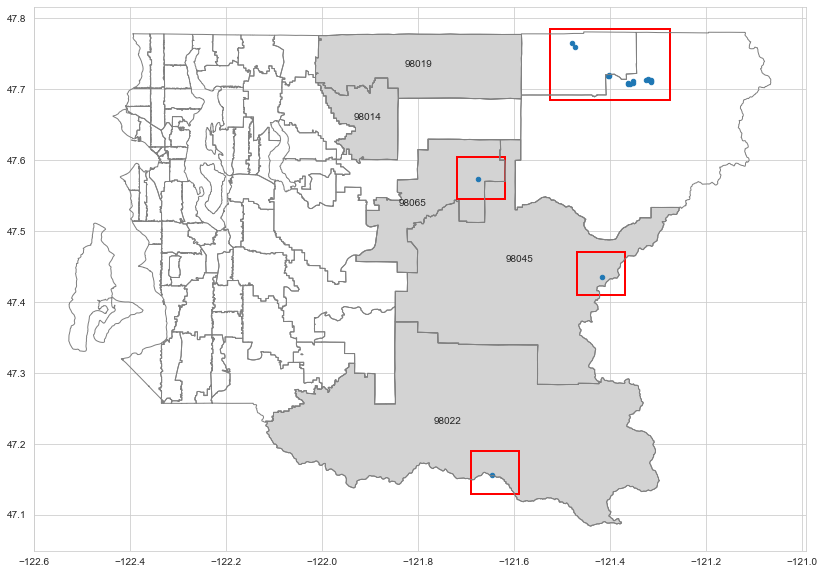

In [70]:
outlier_zipcodes = outliers['zipcode'].unique()
df_geo_kc_filter = df_geo_kc['ZIP'].isin(outlier_zipcodes);

print(f"outlier_zipcodes: {outlier_zipcodes}")

plt.figure(figsize = (14, 10));
ax = plt.gca();

df_geo_kc[df_geo_kc_filter].plot(ax=ax, color='lightgray', edgecolor='gray', zorder=1);
gpd.GeoDataFrame(outliers, geometry='geometry').plot(ax=ax, markersize=20, marker="o", zorder=2);
df_geo_kc.plot(ax=ax, facecolor="none", edgecolor='gray', zorder=3);
show_zipcodes(df_geo_kc[df_geo_kc_filter])

highligh_outliers(ax);

It is very strange that some of these REs zipcodes do not match the King_country Geojson data ZIP values.

I have checked that King_country Geojson data ZIP codes are correct, so it means that either ZIP or lat & long values are wrong for these REs.

I think after excluding these outliers it is better to verify all REs lat & long values by checking zipcode zones.

In [71]:
df.drop(outliers.index, inplace=True)

#### 3) Verifying zipcodes with location

In this work, I will check REs locations are located in the zipcode region or not.

I checked the zipcode definition and it is stated that sometimes zipcodes do not have region meanings. 

But I think it is good to set RE zipcodes based on the zipcode regions given by the King Country Geojson file.

I will use GeoDataFrame __spatial index__ to check the point is in the polygon or not.

In [72]:
df_geo = gpd.GeoDataFrame(df, geometry='geometry');
spatial_index = df_geo.sindex

# problematic_REs is holding wrongly set REs indexes like:
# [wrongly set zipcode] : List of [RE indexes]
problematic_REs = {}
for _, row in df_geo_kc.iterrows():
    kc_zipcode = row['ZIP']
    possible_matches_index = list(spatial_index.intersection(row.geometry.bounds))
    possible_matches = df_geo.iloc[possible_matches_index]
    precise_matches = possible_matches[possible_matches.intersects(row.geometry)]
    
    for idx, problematic_row in precise_matches[precise_matches['zipcode'] != kc_zipcode].iterrows():
        problematic_REs.setdefault(problematic_row['zipcode'], []).extend([idx])

The list of how many problematic REs we have in terms of wrong set zipcodes.

In [73]:
print(f"Wrongly set zipcode: RE counts")
total = 0
for zipcode in sorted(problematic_REs, key=lambda k: len(problematic_REs[k]), reverse=True):
    print(f"zipcode {zipcode} : RE count {len(problematic_REs[zipcode])}")
    total += len(problematic_REs[zipcode])
    
print(f"Total: {total} REs")

Wrongly set zipcode: RE counts
zipcode 98055 : RE count 95
zipcode 98027 : RE count 49
zipcode 98001 : RE count 41
zipcode 98010 : RE count 33
zipcode 98003 : RE count 25
zipcode 98052 : RE count 15
zipcode 98074 : RE count 14
zipcode 98030 : RE count 12
zipcode 98024 : RE count 12
zipcode 98011 : RE count 11
zipcode 98053 : RE count 11
zipcode 98058 : RE count 10
zipcode 98059 : RE count 9
zipcode 98033 : RE count 6
zipcode 98103 : RE count 6
zipcode 98031 : RE count 5
zipcode 98106 : RE count 5
zipcode 98178 : RE count 5
zipcode 98177 : RE count 5
zipcode 98034 : RE count 4
zipcode 98117 : RE count 4
zipcode 98118 : RE count 4
zipcode 98112 : RE count 4
zipcode 98004 : RE count 3
zipcode 98042 : RE count 3
zipcode 98028 : RE count 3
zipcode 98102 : RE count 3
zipcode 98146 : RE count 3
zipcode 98107 : RE count 3
zipcode 98115 : RE count 3
zipcode 98166 : RE count 3
zipcode 98188 : RE count 3
zipcode 98045 : RE count 2
zipcode 98077 : RE count 2
zipcode 98007 : RE count 2
zipcode 9812

Let's plot the first zipcode and mark REs as red if placed outside of the zipcode region:

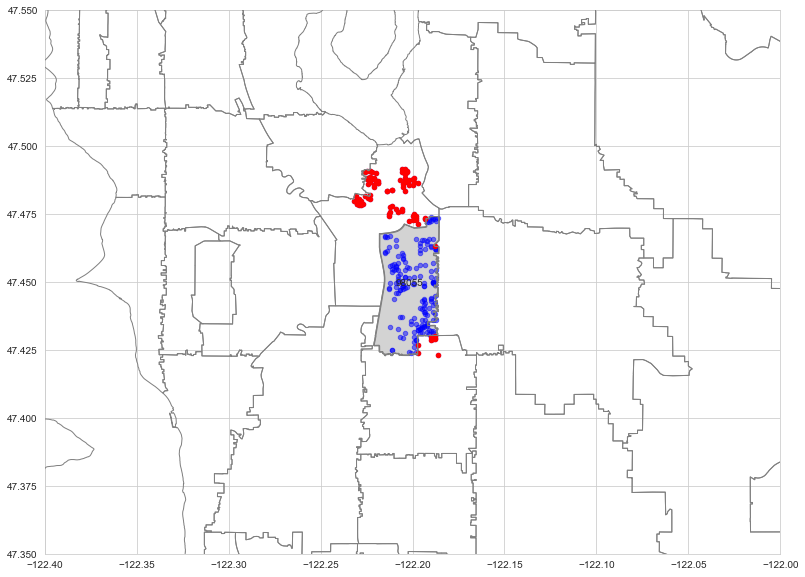

In [74]:
zipcode = 98055       

plt.figure(figsize = (14, 10));
ax = plt.gca();
ax.set(xlim=(-122.4, -122.0), ylim=(47.35, 47.55));

df_geo_kc[df_geo_kc['ZIP'] == zipcode].plot(ax=ax, color='lightgray', edgecolor='gray', zorder=1);
df_geo[df_geo['zipcode'] == zipcode].plot(ax=ax, markersize=20, marker="o", color='blue', alpha=.5, zorder=2);
df_geo.loc[problematic_REs[zipcode]].plot(ax=ax, markersize=20, marker="o", color='red', zorder=3);
df_geo_kc.plot(ax=ax, facecolor="none", edgecolor='gray', zorder=4);
show_zipcodes(df_geo_kc[df_geo_kc['ZIP'] == zipcode])

Correction of the zipcodes in __df__ by calculating which REs are within the zipcode Polygons

In [75]:
for _, row in df_geo_kc.iterrows():
    possible_matches_index = list(spatial_index.intersection(row.geometry.bounds))
    possible_matches = df_geo.iloc[possible_matches_index]
    precise_matches = possible_matches[possible_matches.intersects(row.geometry)]
    
    df.at[precise_matches.index, 'zipcode'] = row['ZIP']

# Store Cleaned Data

The cleaned data will be used on the models:

In [76]:
df.drop(columns=['geometry'], inplace=True)

In [77]:
df.head(2)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,zipcode,lat,long,renovated,age_renovated,has_basement
0,12.309987,3,1.00,7.074117,8.639588,1.0,0,3,7,98178,47.5112,-122.257,0,60,0
1,13.195616,3,2.25,7.852050,8.887791,2.0,0,3,7,98125,47.7210,-122.319,1,24,1


In [79]:
df.to_csv('../../data/02_model/kc_house_data_cleaned_01.csv', index=False) 

# Referances

* 2014-15 Home Sales in King County, WA (RE & Zipcodes GeoJson Data): https://geodacenter.github.io/data-and-lab/KingCounty-HouseSales2015/
* Skewness: https://medium.com/@atanudan/kurtosis-skew-function-in-pandas-aa63d72e20de
* Similar Kaggle Works: 
    * https://www.kaggle.com/fabrizio78/predicting-king-county-house-prices-r2-0-919
    * https://www.kaggle.com/sid321axn/house-price-prediction-gboosting-adaboost-etc
    * https://www.kaggle.com/madislemsalu/predicting-housing-prices-in-king-county-usa
    * https://www.kaggle.com/pouriapaimard/predicting-house-prices-in-king-county
    * https://www.kaggle.com/harlfoxem/house-price-prediction-part-1
    * https://www.kaggle.com/abhinavgargacb/house-price-eda-and-prediction-by-regression
* IQR 1.5: https://www.youtube.com/watch?v=FRlTh5HQORA
* A Better Way to Think about Data Types for Machine Learning: https://towardsdatascience.com/7-data-types-a-better-way-to-think-about-data-types-for-machine-learning-939fae99a689
* Fundamental Techniques of Feature Engineering for Machine Learning: https://towardsdatascience.com/feature-engineering-for-machine-learning-3a5e293a5114
